In [5]:
import scanpy as sc
import numpy as np
import sctm
import squidpy as sq

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In this tutorial, we demonstrate how to analyse Slide-seq data

The prepocessed data can be accessible and downloaded via https://zenodo.org/records/10906593

In [6]:
adata = sc.read_h5ad(
    "../../../../STAMP/Reproducibility/ProcessedData/Slideseq_Mousebrain/adata.h5ad"
)
adata.var_names_make_unique()

In [7]:
# Filter_genes filter out genes that are expressed in less than 1% of the cells
sctm.pp.filter_genes(adata, 0.01)
sc.pp.filter_cells(adata, min_genes = 100)

sq.gr.spatial_neighbors(
    adata,
    n_neighs=round(1/1000 * adata.n_obs),
    coord_type="generic",
    spatial_key="spatial",
)
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, layer="counts", n_top_genes=6000, flavor="seurat_v3", subset = True)

In [17]:
n_topics = 30
# Only hvgs and fit a total of 30 topics here
sctm.seed.seed_everything(0)
#
model = sctm.stamp.STAMP(
    adata[:, adata.var.highly_variable],
    n_topics=n_topics,
    layer = "counts",
    gene_likelihood = "nb")
# uses gpu by default  to use cpu use device="cpu"
model.train(learning_rate = 0.01)

Computing background frequencies


  0%|                                                                                                                        | 0/800 [00:00<?, ?it/s]/home/chengwei/miniconda3/envs/torch/lib/python3.9/site-packages/pyro/primitives.py:443: UserWarning: encoder.norm_topic.0.weight was not registered in the param store because requires_grad=False. You can silence this warning by calling my_module.train(False)
  warnings.warn(
Epoch Loss:982.766:  17%|██████████████▉                                                                       | 139/800 [1:01:35<4:52:52, 26.58s/it]

Early Stopping


In [18]:
topic_prop = model.get_cell_by_topic()
beta = model.get_feature_by_topic()
for i in topic_prop.columns:
    adata.obs[i] = topic_prop[i]

Plotting out of each individual topics

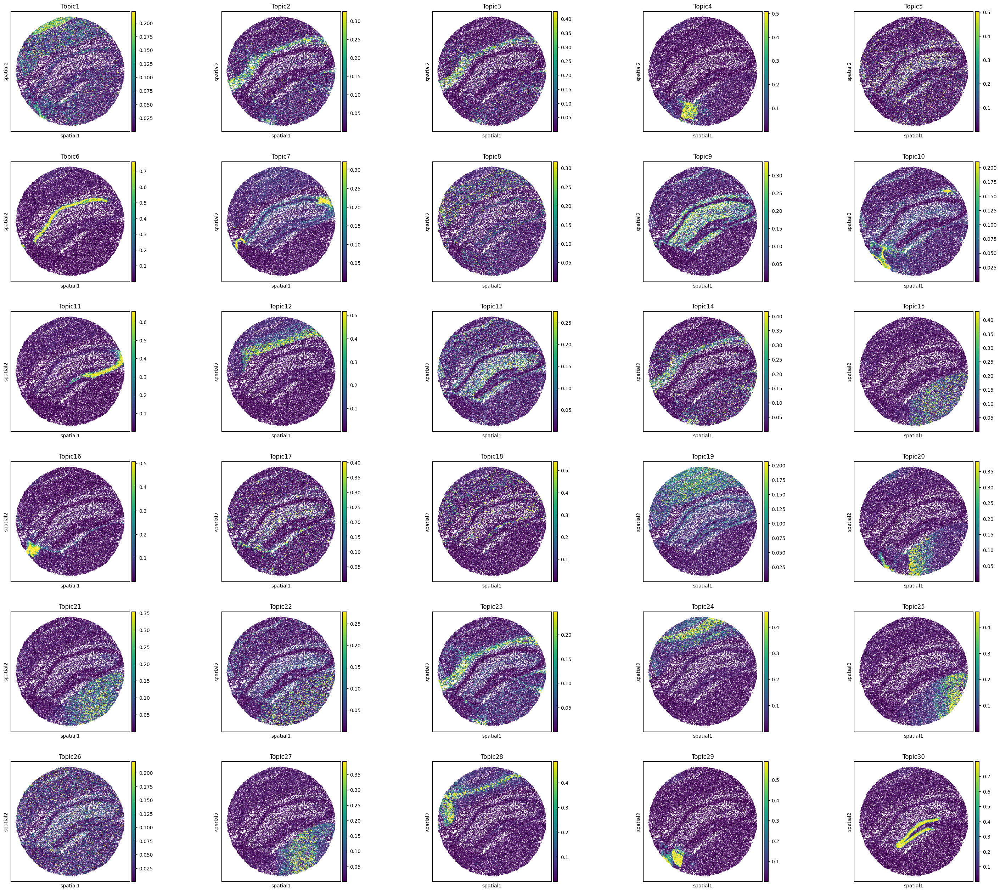

In [19]:
fig = sctm.pl.spatial(adata, color=topic_prop.columns, ncols=5, size=6, vmax="p99", show = False)

In [20]:
topics = ["Topic6", "Topic7", "Topic11", "Topic30", "Topic16", "Topic29", "Topic4"]

In [21]:
genes = []
for topic in topics:
    genes = genes + beta.nlargest(1, topic).index.tolist()

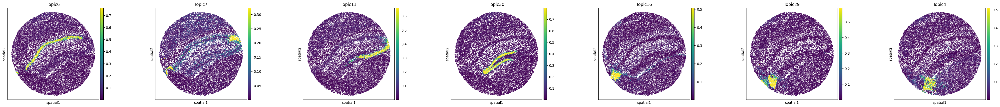

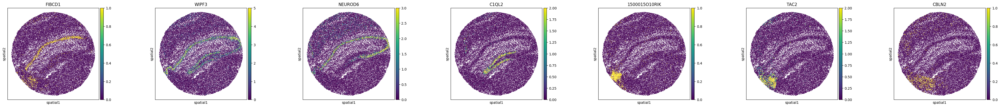

In [24]:
sctm.pl.spatial(adata, color = topics, size = 6, ncols = 7, vmax = 'p99')
sctm.pl.spatial(adata, color = genes, size = 6, ncols = 7, vmax = 'p99')